In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from binarized_modules import BinarizeLinear
from torch.utils.data import DataLoader
import numpy as np
import os
from matplotlib import pyplot as plt

## 1. Training Settings Explanation

This block of code sets up the environment and parameters for training a machine learning model using PyTorch:

- `use_cuda = torch.cuda.is_available()`:
  This line checks if CUDA is available on the machine, which is necessary for GPU acceleration. If a GPU with CUDA capabilities is present, `use_cuda` will be `True`, enabling the model to train on the GPU, otherwise it will train on the CPU.

- `batch_size=1024`:
  The batch size is the number of training examples used to calculate each iteration's gradient during training. A batch size of 1024 means that the model will process 1024 training samples at a time to compute the gradient and update model parameters.

- `test_batch_size= 1024`:
  Similarly to `batch_size`, this specifies the number of samples that will be processed at once during the testing phase. Here, it's also set to 1024, indicating that the model will evaluate 1024 test samples at a time.

- `seed=1`:
  Setting a seed ensures that the random numbers generated are reproducible. A seed of 1 means that every time the code is run, the random elements (like data shuffling) will behave the same way, which is crucial for debugging and comparing different models.

- `log_interval=30000`:
  This parameter indicates how often to log training status. Here, it's set to log the training status every 30,000 training examples. This helps in monitoring the training process without overwhelming the log with too much information.


In [2]:
# Training settings
use_cuda = torch.cuda.is_available()
batch_size=1024                 
test_batch_size= 1024
seed=1
log_interval=30000

## 2. PyTorch Data Loading and Preprocessing for MNIST

This code snippet is designed to prepare and load the MNIST dataset for training a machine learning model using PyTorch. It includes custom transformations and setup for both training and testing data loaders:

### Custom Transformations
- **`ToTensorUnscaled`**:
  This custom class extends the default `transforms.ToTensor()` by preserving the original 0-255 range of image pixel values. Instead of converting pixel values to a range of [0, 1], it converts a PIL image or a NumPy array to a PyTorch tensor while maintaining the original scale.

- **`Binarize`**:
  This transformation binarizes images based on a threshold of 127. Pixel values greater than 127 are set to 1, and others are set to 0. This can be particularly useful for tasks where binary images are required.

### Transformation Pipeline
- **Setup**:
  A transformation pipeline is created using `transforms.Compose`, which includes the following steps:
  1. `transforms.ToTensor()`: Standard conversion to tensor which scales pixel values to [0, 1].
  2. `transforms.Lambda(lambda x: x * 255)`: Scales the tensor values back to [0, 255] to restore the original scale.
  3. `Binarize()`: Applies the binarization as defined in the `Binarize` class.

### DataLoader
- **Training and Test Data Loaders**:
  - `train_loader`: Configured to shuffle the MNIST training dataset, transform it using the defined pipeline, and batch it with a size of 512.
  - `test_loader`: Similar to `train_loader` but uses `test_batch_size` for the batch size and sets `num_workers` to 0 to disable parallel loading.

- **Performance Improvements**:
  - Utilizes CUDA capability checks to optimize DataLoader settings: If CUDA is available, `num_workers` is set to 4, and `pin_memory` is set to True, which can accelerate the data transfer to the GPU.

### Dataset Setup
- Both loaders are connected to the MNIST dataset, automatically downloading it if not present in the './data' directory. The dataset is then processed through the transformation pipeline for both training and testing.

This setup ensures efficient data handling and preprocessing for training a neural network on the MNIST dataset using PyTorch.


In [3]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from PIL import Image
import numpy as np

# Custom transformation: Convert PIL image to tensor while preserving the original 0-255 range
class ToTensorUnscaled(transforms.ToTensor):
    def __call__(self, pic):
        # If it is a PIL Image, convert it to a NumPy array
        if isinstance(pic, Image.Image):
            img = np.array(pic, dtype=np.float32)
        else:
            # If it is already an array, convert it directly
            img = pic.astype(np.float32)
        
        # Convert to tensor
        img = torch.from_numpy(img)

        # Keep the channel as the first dimension
        if len(img.shape) == 2:  # If it is a single-channel image
            img = img.unsqueeze(0)
        else:
            img = img.permute(2, 0, 1)  # Convert the channel from H x W x C to C x H x W

        return img
    
class Binarize(torch.nn.Module):
    def forward(self, img):
        return torch.where(img > 127, 1, 0).float()  # Use .float() if needed for consistency with other transforms

transform_pipeline = transforms.Compose([
    transforms.ToTensor(),  # Converts to [0, 1]
    transforms.Lambda(lambda x: x * 255),  # Scale back to [0, 255]
    Binarize(),  # Apply binarization
])

# Set up DataLoader
kwargs = {'num_workers': 4, 'pin_memory': True} if torch.cuda.is_available() else {}
train_loader = DataLoader(
    datasets.MNIST('./data', train=True, download=True,
                   transform=transform_pipeline),
    batch_size=512, shuffle=True)

test_loader = DataLoader(
    datasets.MNIST('./data', train=True, download=True,
                   transform=transform_pipeline), 
    batch_size=test_batch_size, shuffle=True, num_workers=0)  # Set num_workers to 0

In [4]:
# check if the training data is loaded correctly
for batch_idx, (data, target) in enumerate(train_loader):
        correct = 0
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        print(data[0])
        print(target)
        break

tensor([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 0.,
  

## 3. Neural Network Class `Net` Description

The `Net` class defines a multi-layer neural network for classification purposes, employing binary linear transformations, batch normalization, activation functions, and dropout. It is structured to provide verbose output for debugging and learning how data transforms through the network.

### Constructor: `__init__(self)`
The constructor initializes the neural network layers as follows:
- **BinarizeLinear Layers**: Custom fully connected layers that likely perform binary linear transformations. These layers are used four times in the network to progressively reduce the dimensionality from the input size of 784 to the final class prediction size of 10.
- **Batch Normalization (BatchNorm1d)**: Applied after each BinarizeLinear layer except the last one. These layers normalize the output of the fully connected layers, stabilizing the learning process. The bias is explicitly disabled (`requires_grad = False`) to maintain the effects of the preceding binary transformations.
- **Activation (Hardtanh)**: Hard hyperbolic tangent activation functions are used after each batch normalization layer, providing non-linearities in the model which are crucial for learning complex patterns.
- **Softmax**: Applied after the final linear layer to convert the logits to probabilities, which is typical for multi-class classification tasks.
- **Dropout**: A dropout layer with a probability of 0.4 is included to reduce overfitting by randomly dropping units during training.

### Method: `forward(self, x)`
This method defines the forward pass of the network, detailing how data flows through each component of the network:
- **Input Reshaping**: The input tensor `x` is reshaped from its original image format to a flat vector to match the input requirements of the first fully connected layer.
- **Layer-by-Layer Processing**:
  - For each layer (except the last fully connected layer), the output is processed by the corresponding batch normalization and activation function. Debug print statements provide insight into the output at each stage, including the running mean of the batch normalization layers.
  - The final layer's output, before applying softmax, is also printed to give a sense of what the raw logits look like.
- **Returns**: The method returns a tuple containing the output of the first layer, the final softmax probabilities, and the logits from the last fully connected layer.


In [5]:
class Net(nn.Module):
    """
    A neural network model for classification tasks.

    Args:
        None

    Attributes:
        fc1 (BinarizeLinear): The first fully connected layer.
        bn1 (nn.BatchNorm1d): Batch normalization layer for the first layer.
        htanh1 (nn.Hardtanh): Activation function for the first layer.
        fc2 (BinarizeLinear): The second fully connected layer.
        bn2 (nn.BatchNorm1d): Batch normalization layer for the second layer.
        htanh2 (nn.Hardtanh): Activation function for the second layer.
        fc3 (BinarizeLinear): The third fully connected layer.
        bn3 (nn.BatchNorm1d): Batch normalization layer for the third layer.
        htanh3 (nn.Hardtanh): Activation function for the third layer.
        fc4 (BinarizeLinear): The fourth fully connected layer.
        softmax (nn.Softmax): Softmax activation function.
        drop (nn.Dropout): Dropout layer.

    Methods:
        forward(x): Performs forward pass through the network.

    """

    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = BinarizeLinear(784, 64)
        self.bn1 = nn.BatchNorm1d(64, affine=True)
        self.bn1.bias.requires_grad = False
        self.htanh1 = nn.Hardtanh()

        self.fc2 = BinarizeLinear(64, 32)
        self.bn2 = nn.BatchNorm1d(32, affine=True)
        self.bn2.bias.requires_grad = False
        self.htanh2 = nn.Hardtanh()

        self.fc3 = BinarizeLinear(32, 32)
        self.bn3 = nn.BatchNorm1d(32, affine=True)
        self.bn3.bias.requires_grad = False
        self.htanh3 = nn.Hardtanh()

        self.fc4 = BinarizeLinear(32, 10)
        self.softmax = nn.Softmax(dim=1)
        self.drop = nn.Dropout(0.4)

    def forward(self, x):
        """
        Performs forward pass through the network.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            Tuple[torch.Tensor, torch.Tensor, torch.Tensor]: Output tensors from each layer.

        """
        x = x.view(-1, 28*28)
        ################################
        x1 = self.fc1(x)
        print("first layer output", x1)
        x = self.bn1(x1)
        print("BatchNorm1d running mean:", self.bn1.running_mean) 
        x = self.htanh1(x)
        print("after the first activate function:", x)
        ################################
        x = self.fc2(x)
        print("second layer output", x)
        x = self.bn2(x)
        print("BatchNorm1d running mean:", self.bn2.running_mean) 
        x = self.htanh2(x)
        print("after the second activate function:", x)
        ################################
        x = self.fc3(x)
        print("third layer output", x)
        x = self.bn3(x)
        print("BatchNorm1d running mean:", self.bn3.running_mean) 
        x = self.htanh3(x)
        print("after the third activate function:", x)
        ################################
        x_bf_softmax = self.fc4(x)
        print("the fourth layer output:", x_bf_softmax)
        x = self.softmax(x_bf_softmax)
        return x1, x, x_bf_softmax


In [6]:
model = Net()
# print the number of model parameters

print('Number of model parameters: {}'.format(
    sum([p.data.nelement() for p in model.parameters()])))

if use_cuda:
    torch.cuda.set_device(0)
    model.cuda()

lr = 0.005
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)


Number of model parameters: 53962


## 4. Python Functions for Training and Testing a Neural Network

The provided Python code includes two functions, `train` and `test`, which are used for training and testing a neural network model, respectively. These functions are designed to work with models that have custom mechanisms, such as parameter binarization.

### Train Function

#### Description
The `train` function conducts a single epoch of training over the MNIST dataset using a model, optimizer, and loss function defined outside the function scope.

#### Parameters
- `epoch`: The current epoch number passed to the function for display purposes.

#### Operations
- **CUDA Check**: Moves data to the GPU if CUDA is available.
- **Forward Pass**: Computes the output of the model.
- **Loss Computation**: Calculates the loss using the model's output and the correct labels.
- **Backward Pass**: Performs backpropagation to compute gradients.
- **Parameter Clamping**: Clamps the model parameters between -1 and 1 post-gradient computation.
- **Logging**: Every few batches, as determined by `log_interval`, it logs the current loss and accuracy.

#### Returns
- `loss`: The last computed loss in the epoch.
- `accuracy`: The last computed accuracy in the epoch.

### Test Function

#### Description
The `test` function evaluates the model on a separate dataset and adjusts the weights to be either +1 or -1, which is typical in networks that utilize binarization for efficient computation.

#### Parameters
- `patience`: Used for early stopping, adjusted based on test loss improvement.
- `best_loss`: The minimum loss encountered during testing. Used to update the model's state if a new lower loss is found.

#### Operations
- **Weight Binarization**: Before testing, converts weights and biases in specified layers to binary values.
- **Model Evaluation**: Disables gradient calculations and evaluates the model's performance on the test dataset.
- **Result Logging**: Outputs the average loss and accuracy over the test dataset.
- **Model Saving**: If the test loss is the best seen, it resets the patience and saves the model's parameters to a file.

#### Returns
- `patience`: Updated patience based on the test results.
- `best_loss`: Updated if a new best loss is achieved.
- `test_loss`: Calculated average loss over the test dataset.
- `test_accuracy`: Calculated accuracy over the test dataset.

In [7]:

def train(epoch):

    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        correct = 0
        if use_cuda:
            data, target = data.cuda(), target.cuda()
        optimizer.zero_grad()
        _, output, _ = model(data)
        loss = criterion(output, target)

        optimizer.zero_grad()
        loss.backward()
        for p in list(model.parameters()):
            if hasattr(p, 'org'):
                p.data.copy_(p.org)
        optimizer.step()
        for p in list(model.parameters()):
            if hasattr(p, 'org'):
                p.org.copy_(p.data.clamp_(-1, 1))

        if batch_idx % log_interval == 0:
            #  Print Accuracy
            pred = output.data.max(1, keepdim=True)[1]
            correct += pred.eq(target.data.view_as(pred)).cpu().sum()
            accuracy = 100. * torch.sum(correct) / len(output)
            accuracy_num = accuracy.item()
            print(f'Train Accuracy: {accuracy_num:.2f}%')
            
            #  Print LOSS
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_loader.dataset),
                100. * batch_idx / len(train_loader), loss.item()))
    return loss, accuracy

def test(patience, best_loss):
    """
    Perform testing on the model and calculate the test loss and accuracy.

    Args:
        patience (int): The current patience value.
        best_loss (float): The best loss value.

    Returns:
        tuple: A tuple containing the updated patience value, best loss value, test loss, and test accuracy.
    """
    state_dict = model.state_dict()
    for key in state_dict:
        if key == 'fc1.weight' or key == 'fc2.weight' or key == 'fc3.weight' or key == 'fc4.weight' :
            param = state_dict[key]
            param = torch.where(param >= 0.0, torch.tensor(1.0).cuda(), torch.tensor(-1.0).cuda()).cuda()
            state_dict[key] = param
        if key == 'fc1.bias' or key == 'fc2.bias' or key == 'fc3.bias' or key == 'fc4.bias' :
            param = state_dict[key]
            param = torch.where(param >= 0.0, torch.tensor(0.0).cuda(), torch.tensor(0.0).cuda()).cuda()
            state_dict[key] = param
        if key == 'bn1.bias' or key == 'bn2.bias' or key == 'bn3.bias':
            param = state_dict[key]
            param = torch.where(param >= 0.0, torch.tensor(0.0).cuda(), torch.tensor(0.0).cuda()).cuda()
            state_dict[key] = param

    model.load_state_dict(state_dict)

    model.eval()
    test_loss = 0
    correct = 0

    with torch.no_grad():
        for data, target in test_loader:
            if use_cuda:
                data, target = data.cuda(), target.cuda()
            data, target = Variable(data), Variable(target)
            _, output, _ = model(data)
            test_loss += criterion(output, target).item()  # sum up batch loss
            pred = output.data.max(1, keepdim=True)[1]  # get the index of the max log-probability
            correct += pred.eq(target.data.view_as(pred)).cpu().sum()

    test_loss /= len(test_loader.dataset)
    print('\nTest set: Average loss: {:.4f}, Accuracy: {}/{} ({:.0f}%)\n'.format(
        test_loss, correct, len(test_loader.dataset),
        100. * correct / len(test_loader.dataset)))
    test_accuracy = 100. * correct / len(test_loader.dataset)
    if test_loss < best_loss:
        best_loss = test_loss
        patience = 5
        print(model)
        if os.path.exists("model.txt"):
            os.remove("model.txt")
        f = open("model.txt", "a")       
        print("Model's state_dict:")
        for param_tensor in model.state_dict():
            print(param_tensor, "\t", model.state_dict()[param_tensor])
            if param_tensor == 'fc1.weight' or param_tensor == 'fc2.weight' or param_tensor == 'fc3.weight' or param_tensor == 'fc4.weight' :
                f.write(str(param_tensor) + "\n")
                tensor_numpy = model.state_dict()[param_tensor].cpu().numpy()
                np.savetxt(f, tensor_numpy, fmt='%s')
                f.write("\n")
        f.close()
    else:
        patience -= 1

    return patience, best_loss, test_loss, test_accuracy



## 5. Main Execution Block for Neural Network Training and Testing

The main block of the script is designed to manage the entire process of training and evaluating a neural network model across a specified number of epochs. It employs early stopping based on the test loss to prevent overfitting and unnecessary computations.

### Overview
The script initiates training and testing cycles for the model, capturing and recording the performance metrics such as loss and accuracy for both training and testing phases. It checks for improvements in test loss to decide whether to continue or halt the training process (early stopping).

### Parameters
- **patience (int)**: The number of epochs to continue training without improvement in test loss before stopping the training early.
- **best_loss (float)**: The lowest test loss observed during the training iterations. It is used to determine if a new epoch has resulted in an improvement.
- **epoch (int)**: The total number of epochs for which the model should be trained, unless early stopping criteria are met.

### Key Variables
- **train_losses**: A list that records the loss of the model for each training epoch.
- **train_accuracies**: A list that records the accuracy of the model for each training epoch.
- **test_losses**: A list that records the loss of the model for each testing epoch.
- **test_accuracies**: A list that records the accuracy of the model for each testing epoch.

### Execution Flow
1. **Initialization**: Sets initial values for `patience`, `best_loss`, and `epoch`. Also, initializes lists to store loss and accuracy metrics.
2. **Training and Testing Loop**:
   - For each epoch up to the maximum specified:
     - Trains the model using the `train` function which returns the loss and accuracy for that epoch.
     - Tests the model using the `test` function which also updates the `patience` and `best_loss` based on the outcomes.
     - Appends the returned metrics to their respective lists.
     - Checks if the `patience` has reached zero (no improvement in `best_loss` for 'patience' number of epochs), in which case it prints "Early stopping..." and breaks out of the loop.

### Early Stopping
- **Mechanism**: If there is no improvement in test loss for a consecutive number of epochs equal to `patience`, the training process will stop early. This is crucial for avoiding overfitting and saving computational resources.


In [8]:
if __name__ == '__main__':
    """
    Main function to train and test the model for a given number of epochs.
    
    Args:
        patience (int): Number of epochs to wait for improvement in validation loss before early stopping.
        best_loss (float): Best validation loss achieved so far.
        epoch (int): Total number of epochs to train the model.
    
    """
    patience = 3
    best_loss = 1000000
    epoch = 1000

    train_losses = []
    train_accuracies = []
    
    test_losses = []
    test_accuracies = []
    
    for epoch in range(1, epoch + 1):
        print("epoch: ", epoch)
        train_loss, train_accuracy = train(epoch)
        patience, best_loss, test_loss, test_accuracy = test(patience, best_loss)
        train_losses.append(train_loss.item())
        train_accuracies.append(train_accuracy.item())
        test_losses.append(test_loss)
        test_accuracies.append(test_accuracy)
        if patience == 0:
            print('Early stopping...')
            break

epoch:  1
#####################################################################################
The binarized outcome of the input layer:  tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]], device='cuda:0')
#####################################################################################
first layer output tensor([[ 4.0144e+00, -3.9845e+00, -6.0037e+00,  ...,  8.0187e+00,
         -4.0230e+00,  7.9730e+00],
        [ 1.0014e+01, -1.1984e+01, -4.0037e+00,  ...,  4.0187e+00,
         -2.0230e+00,  9.9730e+00],
        [-9.8556e-01, -6.9845e+00, -5.0037e+00,  ..., -6.9813e+00,
         -3.0230e+00,  1.0973e+01],
        ...,
        [-3.9856e+00,  6.0155e+00, -3.6967e-03,  ..., -3.9813e+00,
          1.9770e+00,  1.5973e+01],
        [-3.9856e+00, -1.7984e+01,  9.9963e+00,  ..., -7.981

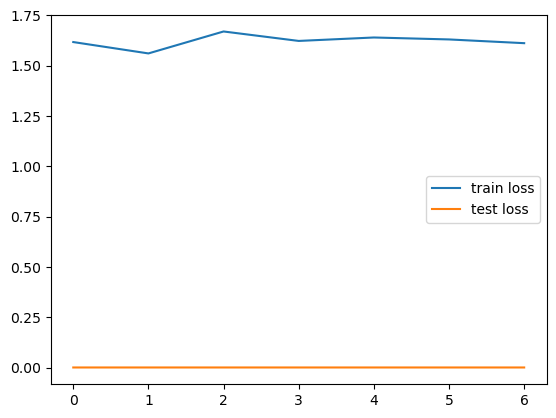

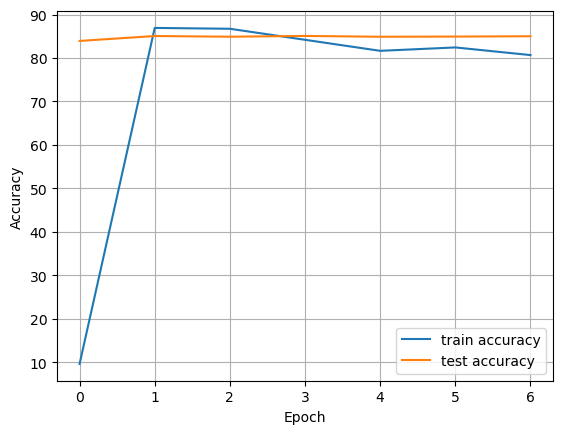

In [18]:
# plot the training and test loss curve
plt.plot(train_losses, label='train loss')
plt.plot(test_losses, label='test loss')
plt.legend()
plt.show()

# plot the training and test accuracy curve
plt.plot(train_accuracies, label='train accuracy')
plt.plot(test_accuracies, label='test accuracy')
plt.legend()
# Labeling the axes
plt.xlabel('Epoch')  # X-axis label
plt.ylabel('Accuracy')  # Y-axis label
# grid on
plt.grid(True)
plt.show()

In [10]:
# save the model to the current file
torch.save(model.state_dict(), 'model.pth')

In [11]:
# load the model from the current file

model.load_state_dict(torch.load('model.pth'))
model.eval()

Net(
  (fc1): BinarizeLinear(in_features=784, out_features=64, bias=True)
  (bn1): BatchNorm1d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (htanh1): Hardtanh(min_val=-1.0, max_val=1.0)
  (fc2): BinarizeLinear(in_features=64, out_features=32, bias=True)
  (bn2): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (htanh2): Hardtanh(min_val=-1.0, max_val=1.0)
  (fc3): BinarizeLinear(in_features=32, out_features=32, bias=True)
  (bn3): BatchNorm1d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (htanh3): Hardtanh(min_val=-1.0, max_val=1.0)
  (fc4): BinarizeLinear(in_features=32, out_features=10, bias=True)
  (softmax): Softmax(dim=1)
  (drop): Dropout(p=0.4, inplace=False)
)

## Detailed Explanation of the Test Loop in Python

This code snippet performs detailed testing and logging for each layer of the binray neural network using the PyTorch framework. The snippet iterates through test data, applies the model to each sample, and logs various outputs for debugging and inspection.

### Loop Over Test Data
- Each data point (image) and its corresponding target (label) from the `test_loader` are processed one by one. The loop is set to potentially handle 1024 iterations (test batch size = 1024), though it breaks after the first due to a break statement at the end. If want to print 1024 iterations, just delete the first 'break'.

### Additional Information
- **example.txt**: The flattened and binarized MNIST data will be stored in this file.
- **label compare.txt**: This file store the target label and predicted label. The first figure is the true label, the second figure is the predicted label (e.g., 42, 4 is the true label, 2 is the predicted label).
- **before_softmax_output.txt**: This file stores the output before softmax, which helps to debug.


In [1]:
for data, target in test_loader:
    
    if use_cuda:
        data, target = data.cuda(), target.cuda()
    data, target = Variable(data), Variable(target)
    for i in range(1024):
        fc1_output, output, bf_softmax_output = model(data[i])
        print(data[i].shape)
        pred = output.data.max(1, keepdim=True)[1]  # get the index of the max log-probability
        if use_cuda:
            pred = pred.cpu()  # Move pred to CPU
            target = target.cpu()  # Move target to CPU
            print("pred:", pred.shape)
            print("target:", target.shape)
        prediction_item = pred.item()  # Extract the integer value from the tensor
        target_item = target[i].item()  # Extract the integer value from the tensor
        print("prediction:", prediction_item)
        print("target:", target_item)
        
        with open("label compare.txt", "a") as f:
            f.write(str(target_item) + str(prediction_item) + '\n')


        # store the data in example.txt
        f = open("example.txt", "a")
        numpy_data = data[i].view(-1, 28 * 28).cpu().numpy()
        integer_data = numpy_data.flatten().astype(int)
        # f.write(str(numpy_data))
        label_data = target[i].cpu().numpy()
        # f.write(''.join(map(str, label_data.flatten())))
        f.write(''.join(map(str, integer_data.flatten())) + '\n')
        # f.write("\n")
        f.close()

        print("##################################################################################")
        print("target: ", target)
        print("##################################################################################")


        print("output:", output)
        print("##################################################################################")

        f = open("before_softmax_output.txt", "a")
        if bf_softmax_output.is_cuda:
            bf_softmax_output = bf_softmax_output.cpu()
        integer_data = bf_softmax_output.detach().numpy().astype(int)
        f.write(''.join(map(str, integer_data)) + '\n')
        f.close()
        print("bf_softmax_output:", bf_softmax_output)
        print("##################################################################################")
        # break ****explanation: this break is used to stop the loop after the first iteration, so that we can see the output of the first image
    break


NameError: name 'test_loader' is not defined